# some imports

In [32]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import os

from SAMpy.red_SAM import *
from SAMpy.an_SAM import *
from SAMpy.cal_SAM import *
from SAMpy.oi_SAM import *
from SAMpy.emcee_SAM import *
from SAMpy.grid_SAM import *
from SAMpy.SAM_mask import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# create the mask sampling files!

### this can take a while depending on how many pixels you want to use for your FFTs

In [33]:
cdir = 'f480m_niriss_mask/'
make_coords(cdir,jwst_filt='f480m',npix=256,pmask=int(125.0/4.0)/4.8*3.8,pscam=0.065,redo=False)

[4.677 4.697 4.717 4.737 4.757 4.777 4.797 4.817 4.837 4.857 4.877 4.897
 4.917 4.937 4.957]


# read in some subset of the AB Dor commissioning data (after sorting through it a bit :)

In [34]:
files_ref1 = [
              "MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093015001_03102_00001_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093016001_03102_00001_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093017001_03102_00003_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093017001_03102_00004_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093017001_03102_00005_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093017001_03102_00002_nis_cal.fits",
              #"MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093017001_03102_00001_nis_cal.fits",
]

In [35]:
files_ABDor = [
                #"MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093012001_03105_00001_nis_cal.fits",
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093014001_03102_00001_nis_cal.fits
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093013001_03105_00001_nis_cal.fits
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093014001_03102_00005_nis_cal.fits
                "MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093012001_03102_00001_nis_cal.fits"
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093014001_03102_00004_nis_cal.fits
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093014001_03102_00003_nis_cal.fits
                #MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093013001_03102_00001_nis_cal.fits
]

In [36]:
files_ref2 = [
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00024_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00023_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00007_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00015_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00012_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00022_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00025_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00013_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00014_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00001_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00006_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00019_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00018_nis_cal.fits",
                "MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093018001_03102_00001_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00008_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00009_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00020_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00016_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00011_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093019001_03102_00001_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00004_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00003_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00021_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00002_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00005_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00010_nis_cal.fits",
                #"MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093020001_03102_00017_nis_cal.fits"
    
    
]

# apply some basic reduction steps

### first read in the images, their DQ flags, roll angle, time, and filter info

In [37]:
ims_r1,dqs_r1,bpmaps_r1,roll_r1,uts_r1,fs_r1 = read_calims(files_ref1)
ims_sc,dqs_sc,bpmaps_sc,roll_sc,uts_sc,fs_sc = read_calims(files_ABDor)
ims_r2,dqs_sc,bpmaps_r2,roll_r2,uts_r2,fs_r2 = read_calims(files_ref2)
ut_m_r1 = np.mean(uts_r1)
ut_m_sc = np.mean(uts_sc)
ut_m_r2 = np.mean(uts_r2)
roll_m_r1 = np.mean(roll_r1)
roll_m_r2 = np.mean(roll_r2)
roll_m_sc = np.mean(roll_sc)

MAST_2022-07-14T2044/SortedFiles/Ref1_HD37093/jw01093015001_03102_00001_nis_cal.fits
MAST_2022-07-14T2044/SortedFiles/ABDor/jw01093012001_03102_00001_nis_cal.fits
MAST_2022-07-14T2044/SortedFiles/Ref2_HD36805/jw01093018001_03102_00001_nis_cal.fits


### next apply a bad pixel correction based on the arrays of DQ flags (plots shown on log scale)

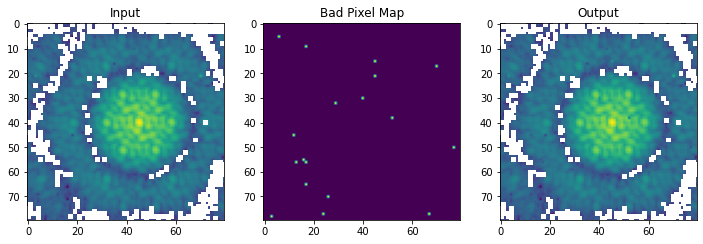

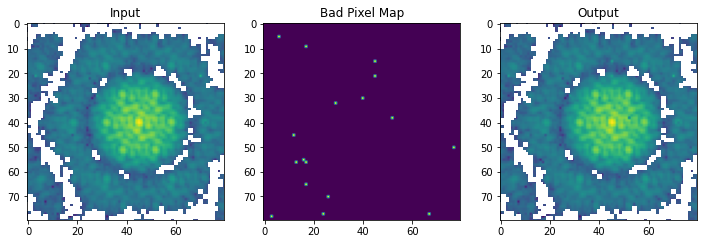

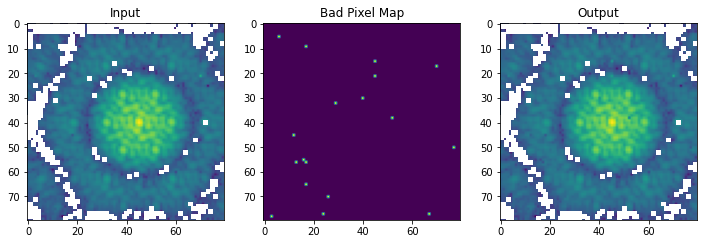

In [38]:
imsb_r1 = badpixels(ims_r1,bpmaps_r1,size=1,display=True)
imsb_sc = badpixels(ims_sc,bpmaps_sc,size=1,display=True)
imsb_r2 = badpixels(ims_r2,bpmaps_r2,size=1,display=True)

### then center each set of images

In [39]:
ims_r1_s = subframe(imsb_r1,sfsize=70)
ims_sc_s = subframe(imsb_sc,sfsize=70)
ims_r2_s = subframe(imsb_r2,sfsize=70)

### the commented-out example below shows you how you might do annular background subtraction, but we're skipping it...

In [40]:
"""
####skipping background subtraction for now
imsbg_r1 = bkg_sub(ims_r1_s,rmin=30,rmax=40)
imsbg_sc = bkg_sub(ims_sc_s,rmin=30,rmax=40)
imsbg_r2 = bkg_sub(ims_r2_s,rmin=30,rmax=40)
"""
imsbg_r1 = copy.deepcopy(ims_r1_s)
imsbg_sc = copy.deepcopy(ims_sc_s)
imsbg_r2 = copy.deepcopy(ims_r2_s)

### apply a super-Gaussian window (if you like)

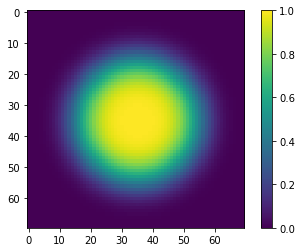

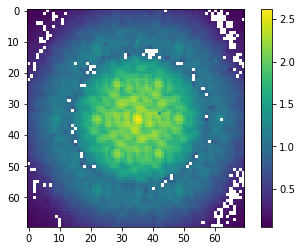

In [41]:
lamc = 4.8
imsbgw_r1 = apply_wind(imsbg_r1,lamc,0.065,display=True) #use display=True to see a picture of the window
imsbgw_sc = apply_wind(imsbg_sc,lamc,0.065,display=False)
imsbgw_r2 = apply_wind(imsbg_r2,lamc,0.065,display=False)

###take a peek at the windowed image
plt.imshow(imsbgw_r1[0]**0.1)
plt.colorbar()
plt.show()

### writing out some copies just for fun (these don't get used later)

In [42]:
pyfits.writeto('ABDor_cleaned.fits',np.array(imsbgw_sc),overwrite=True)
pyfits.writeto('Ref1_cleaned.fits',np.array(imsbgw_r1),overwrite=True)
pyfits.writeto('Ref2_cleaned.fits',np.array(imsbgw_r2),overwrite=True)

# next, calculate raw Fourier observables

### calculate the closure phases using the sampling coordinates (use display=True to see plots of all the sampling coordinates for the first image in the stack)

  0%|                                               | 0/1 [00:00<?, ?it/s]

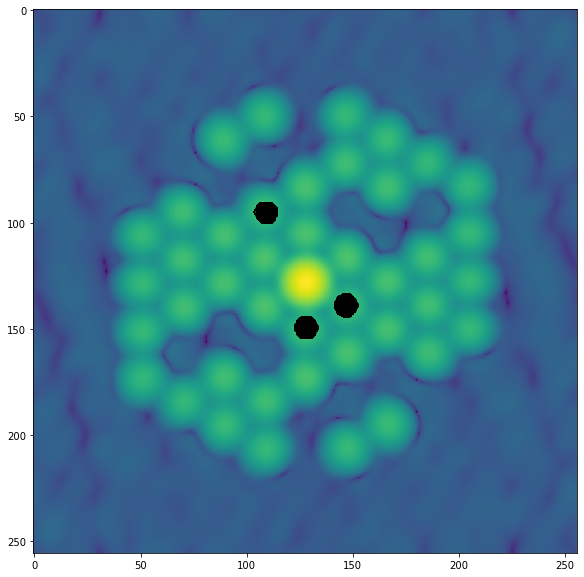

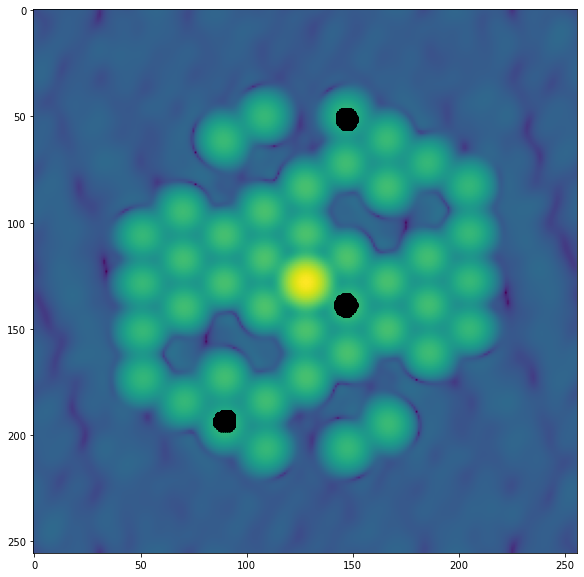

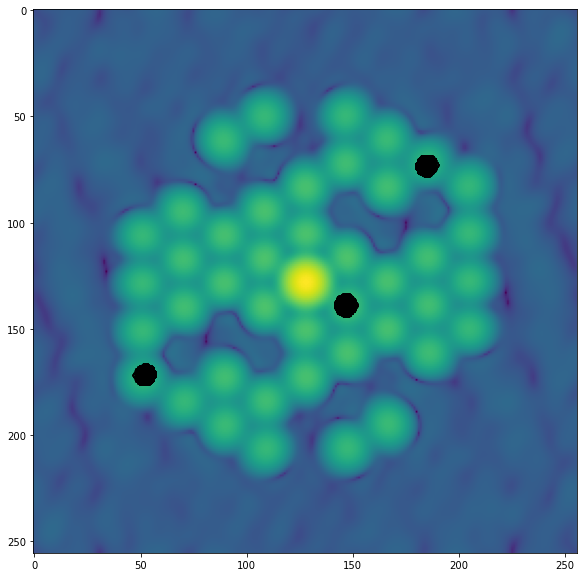

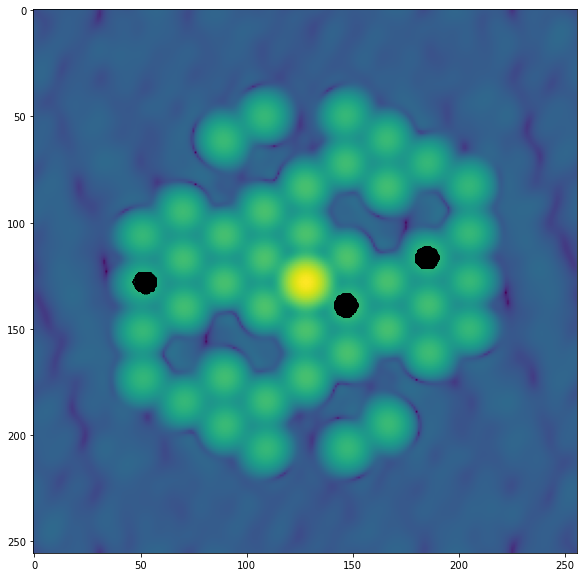

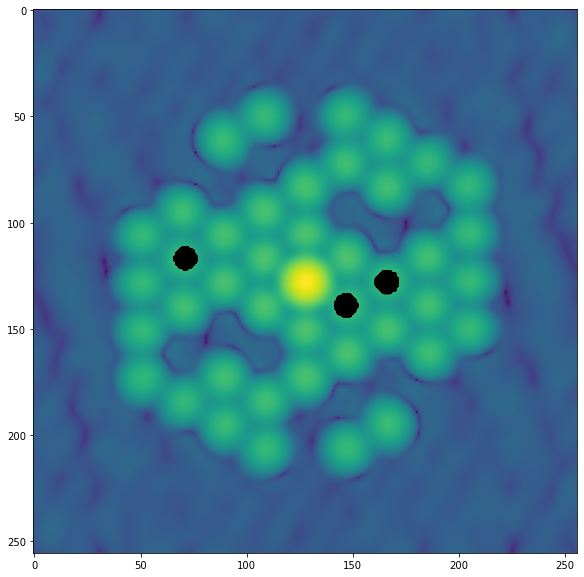

...

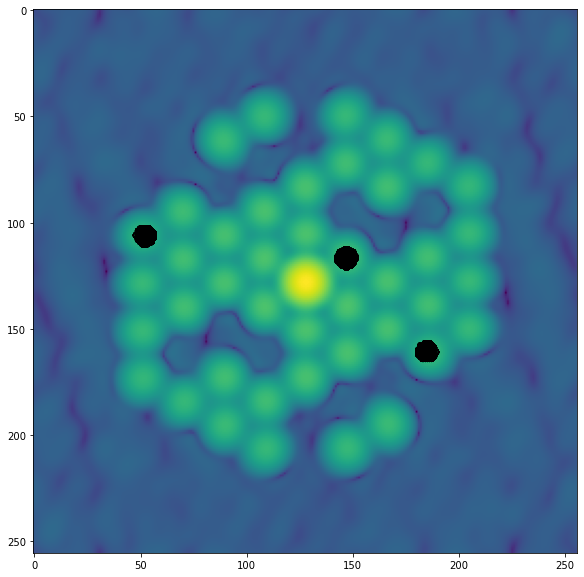

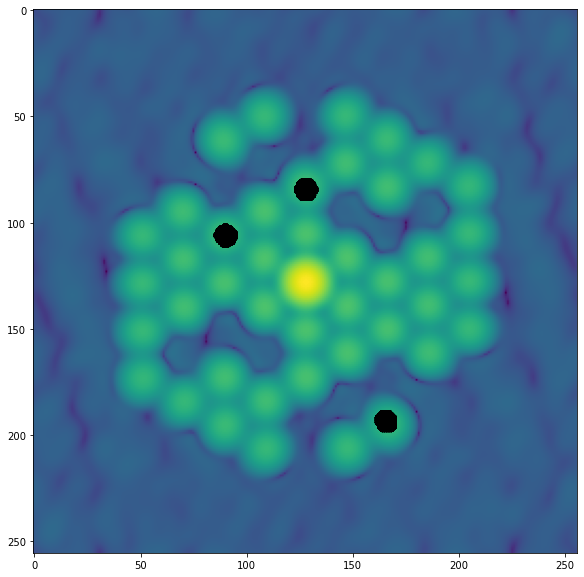

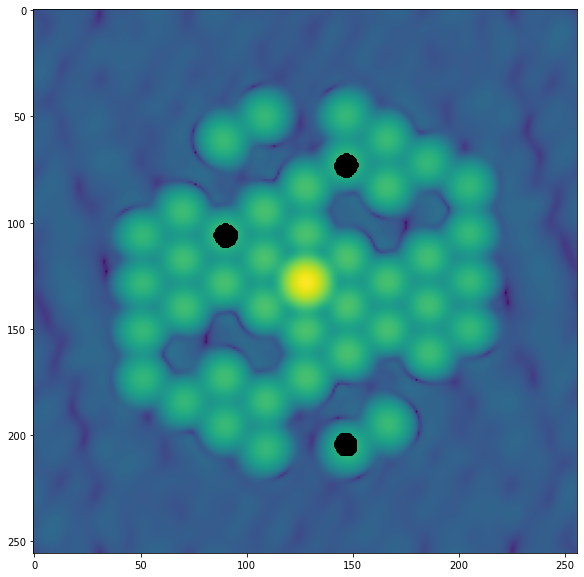

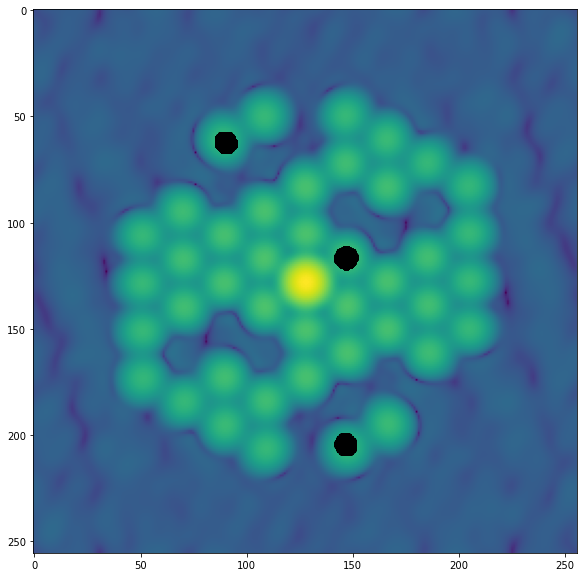

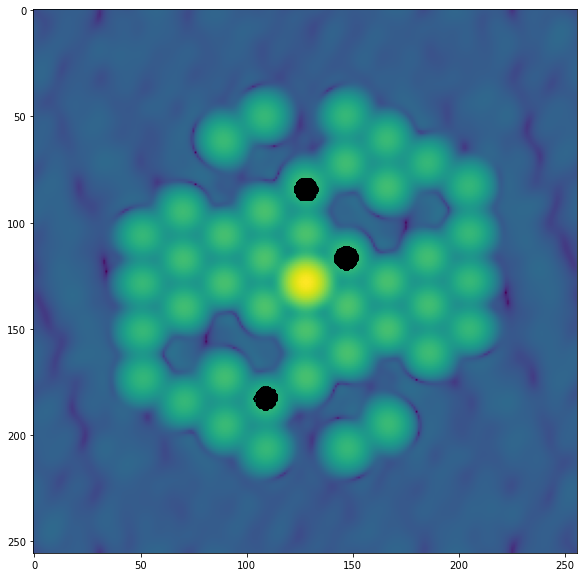

100%|███████████████████████████████████████| 1/1 [00:09<00:00,  9.02s/it]


In [43]:
cps_r1 = calc_cps_multi(imsbgw_r1,cdir,display=True,useW=False)

In [44]:
cps_sc = calc_cps_multi(imsbgw_sc,cdir,display=False,useW=False)

100%|███████████████████████████████████████| 1/1 [00:00<00:00,  7.21it/s]


In [45]:
cps_r2 = calc_cps_multi(imsbgw_r2,cdir,display=False,useW=False)

100%|███████████████████████████████████████| 1/1 [00:00<00:00,  7.28it/s]


### plot some closure phases

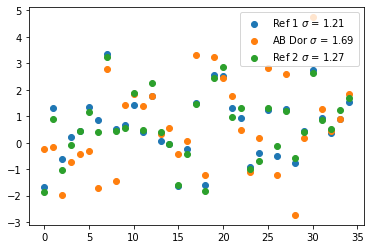

In [46]:
plt.scatter(range(len(cps_r1[1])),cps_r1[1],label = r'Ref 1 $\sigma$ = '+ str(np.round(np.std(cps_r1[1]),2)))
plt.scatter(range(len(cps_sc[1])),cps_sc[1],label = r'AB Dor $\sigma$ = '+ str(np.round(np.std(cps_sc[1]),2)))
plt.scatter(range(len(cps_r2[1])),cps_r2[1],label = r'Ref 2 $\sigma$ = '+ str(np.round(np.std(cps_r2[1]),2)))
plt.legend()
plt.show()

### plot some triple amplitudes

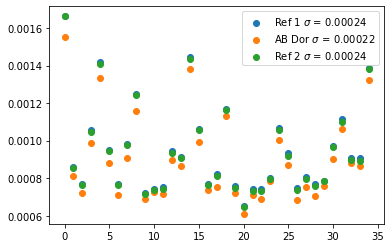

In [47]:
plt.scatter(range(len(cps_r1[2])),cps_r1[2],label = r'Ref 1 $\sigma$ = '+ str(np.round(np.std(cps_r1[2]),5)))
plt.scatter(range(len(cps_sc[2])),cps_sc[2],label = r'AB Dor $\sigma$ = '+ str(np.round(np.std(cps_sc[2]),5)))
plt.scatter(range(len(cps_r2[2])),cps_r2[2],label = r'Ref 2 $\sigma$ = '+ str(np.round(np.std(cps_r2[2]),5)))
plt.legend()
plt.show()

### calculate the squared visibilities using the sampling coordinates (use display=True to see plots of all the sampling coordinates for the first image in the stack)

100%|███████████████████████████████████████| 1/1 [00:00<00:00, 64.87it/s]


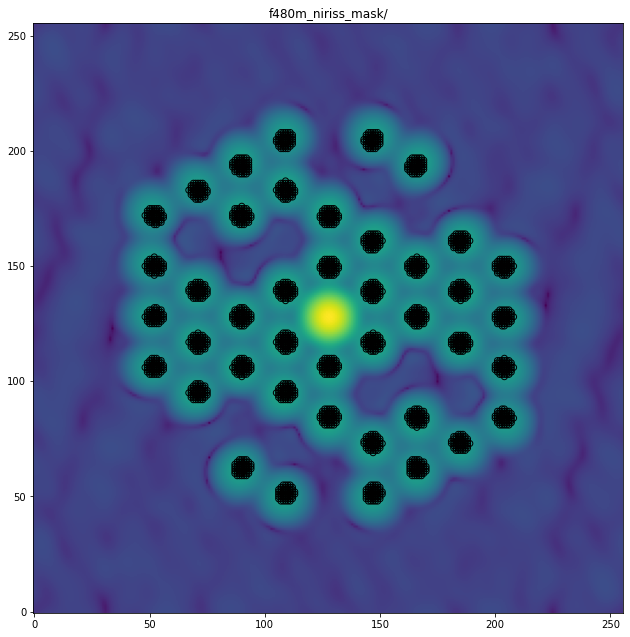

In [48]:
v2s_r1 = calc_v2s(imsbgw_r1,cdir,display=True)

100%|███████████████████████████████████████| 1/1 [00:00<00:00, 67.01it/s]


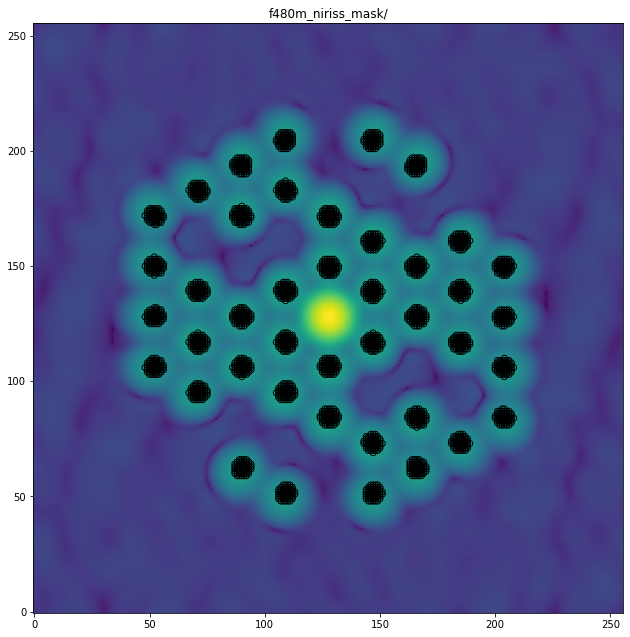

In [49]:
v2s_sc = calc_v2s(imsbgw_sc,cdir,display=True)

100%|███████████████████████████████████████| 1/1 [00:00<00:00, 67.93it/s]


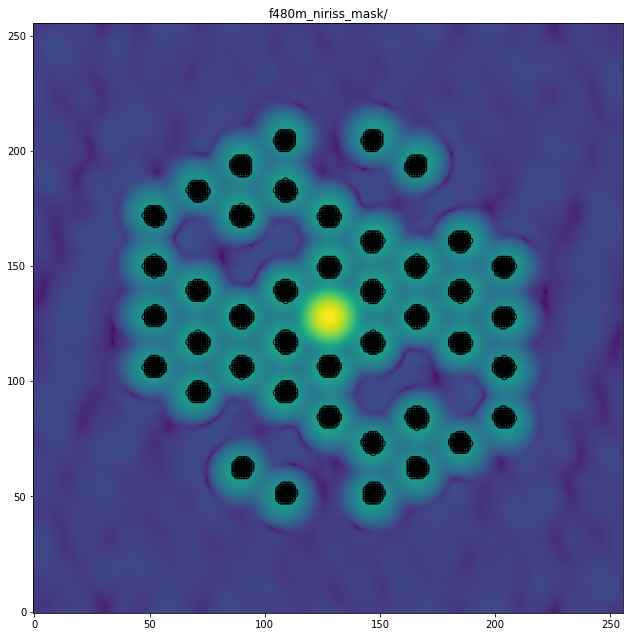

In [50]:
v2s_r2 = calc_v2s(imsbgw_r2,cdir,display=True)

### plot some squared visibilities

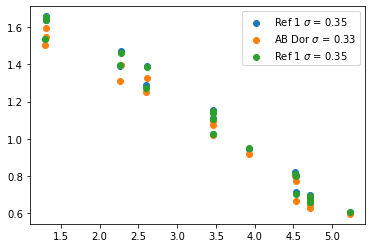

In [51]:
blens = make_blens(cdir)
plt.scatter(blens,v2s_r1[0],label=r'Ref 1 $\sigma$ = '+ str(np.round(np.std(v2s_r1[0]),2)))
plt.scatter(blens,v2s_sc[0],label=r'AB Dor $\sigma$ = '+ str(np.round(np.std(v2s_sc[0]),2)))
plt.scatter(blens,v2s_r2[0],label=r'Ref 1 $\sigma$ = '+ str(np.round(np.std(v2s_r2[0]),2)))
plt.legend()
plt.show()

# calibrate the observables

### use a simple closure phase calibration first

In [52]:
cal_cps_sci = cps_sc[1] - 0.5*(cps_r1[1]+cps_r2[1])
cal_cps_sci_r1 = cps_sc[1] - cps_r1[1]
cal_cps_sci_r2 = cps_sc[1] - cps_r2[1]
cal_r1_r2 = cps_r1[1] - cps_r2[1] ### "calibrate the calibrators"

### plot them to see how they look

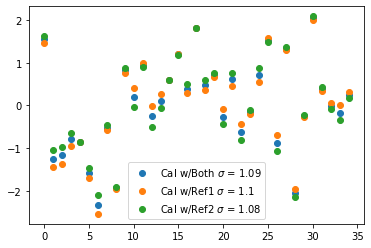

In [53]:
plt.scatter(range(len(cps_r1[1])),cal_cps_sci,label = r'Cal w/Both $\sigma$ = '+ str(np.round(np.std(cal_cps_sci),2)))
plt.scatter(range(len(cps_r1[1])),cal_cps_sci_r1,label = r'Cal w/Ref1 $\sigma$ = '+ str(np.round(np.std(cal_cps_sci_r1),2)))
plt.scatter(range(len(cps_r1[1])),cal_cps_sci_r2,label = r'Cal w/Ref2 $\sigma$ = '+ str(np.round(np.std(cal_cps_sci_r2),2)))
plt.legend()
plt.show()

### a simple squared visibility calibration

In [54]:
cal_v2s_sci = v2s_sc[0] / (0.5*(v2s_r1[0]+v2s_r2[0]))
cal_v2s_sci_r1 = v2s_sc[0] / v2s_r1[0]
cal_v2s_sci_r2 = v2s_sc[0] / v2s_r2[0]
cal_v2s_r1_r2 = v2s_r1[0] / v2s_r2[0]

### plot those up

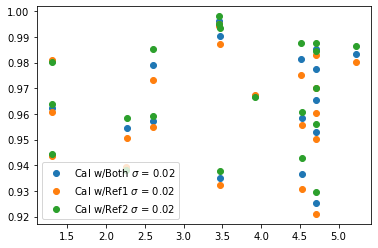

In [55]:
plt.scatter(blens,cal_v2s_sci,label = r'Cal w/Both $\sigma$ = '+ str(np.round(np.std(cal_v2s_sci),2)))
plt.scatter(blens,cal_v2s_sci_r1,label = r'Cal w/Ref1 $\sigma$ = '+ str(np.round(np.std(cal_v2s_sci_r1),2)))
plt.scatter(blens,cal_v2s_sci_r2,label = r'Cal w/Ref2 $\sigma$ = '+ str(np.round(np.std(cal_v2s_sci_r2),2)))
plt.legend()
plt.show()

### example of using polynomial fitting in time to do calibration (doesn't really matter much for these data, since there are just two calibrator observations, both taken after the science target. but it's here anyway in case you're curious.)

cords = 0


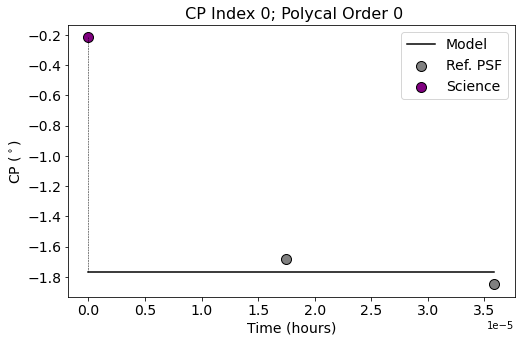

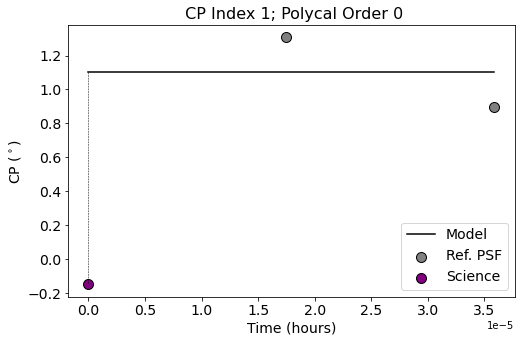

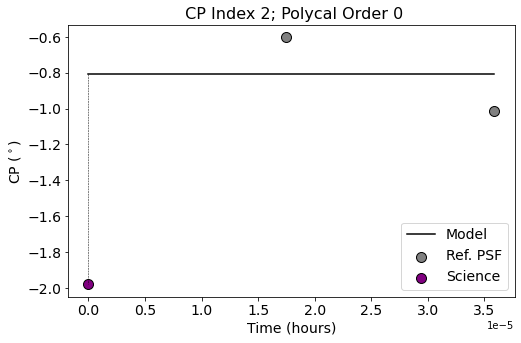

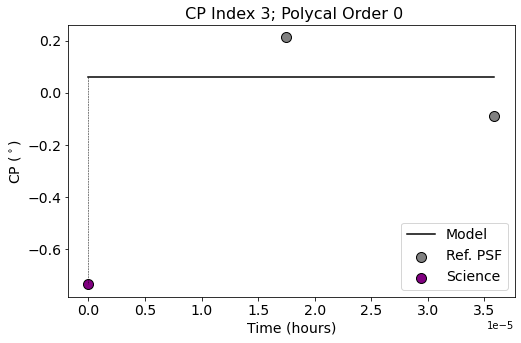

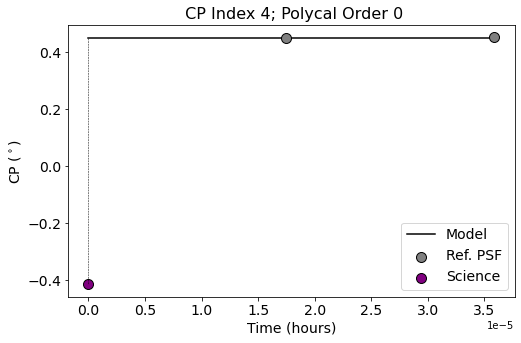

...

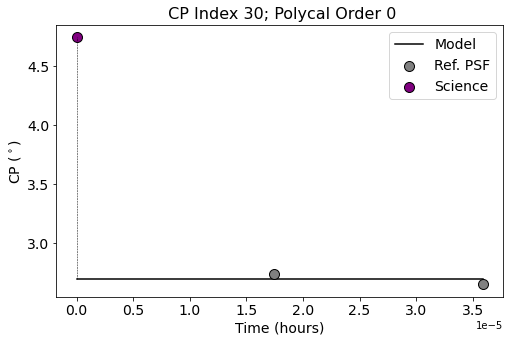

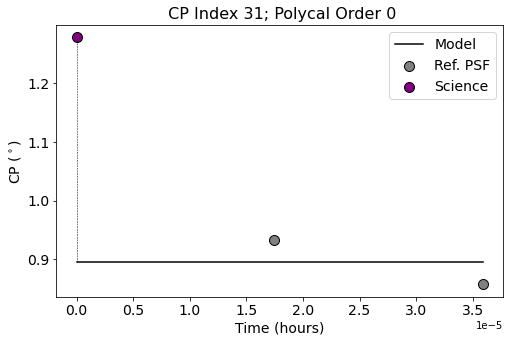

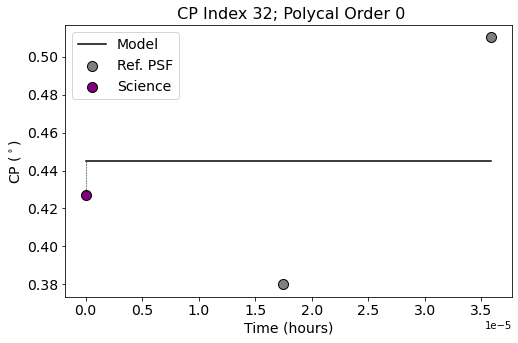

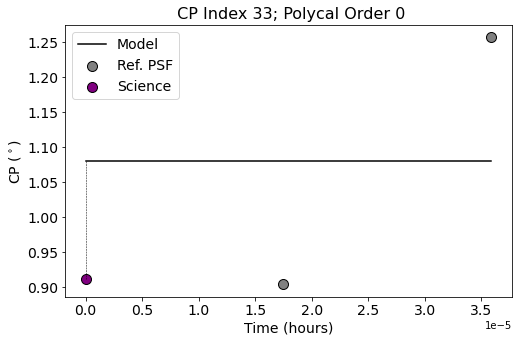

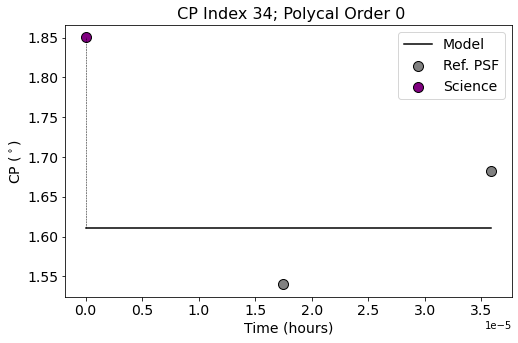

cords = 1


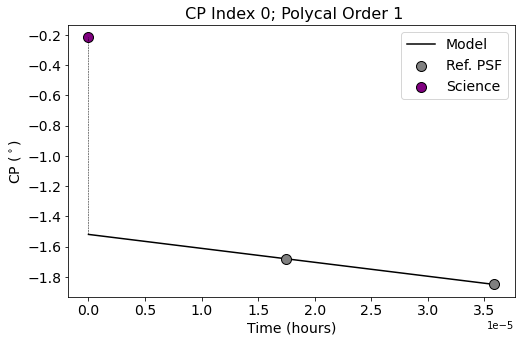

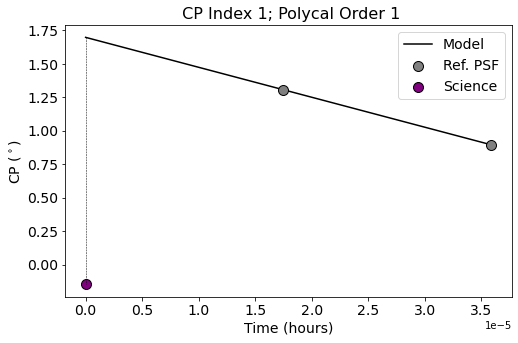

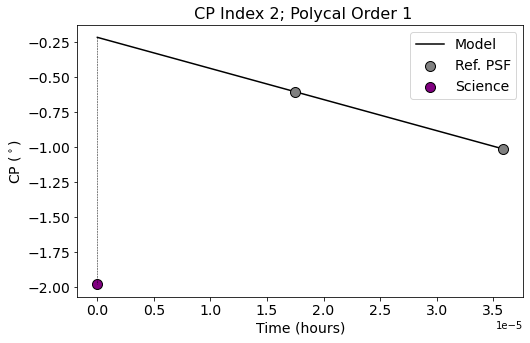

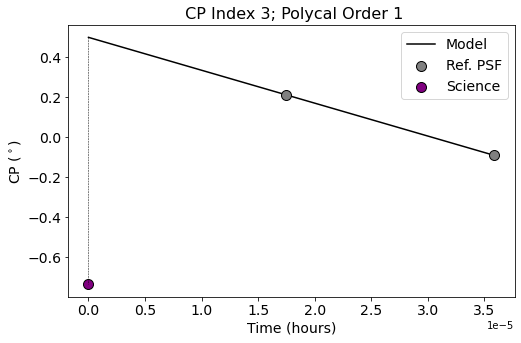

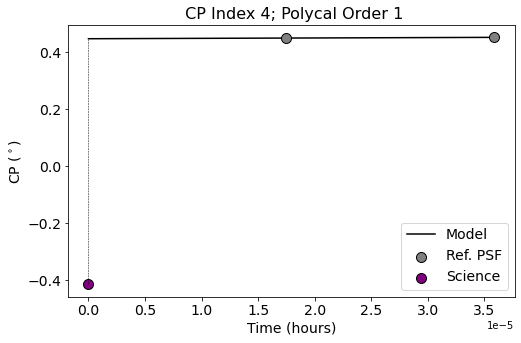

...

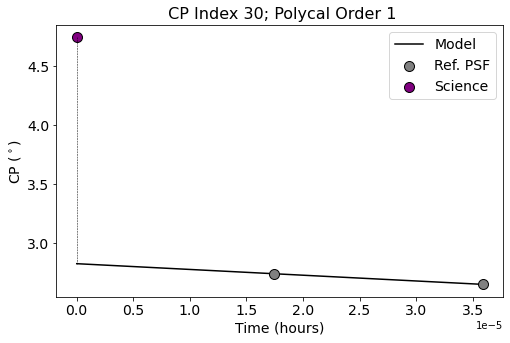

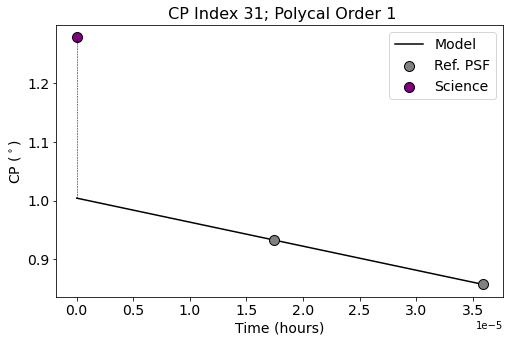

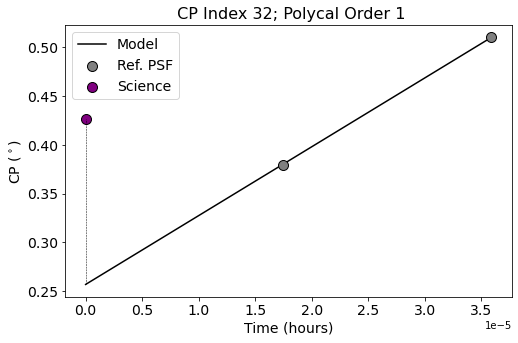

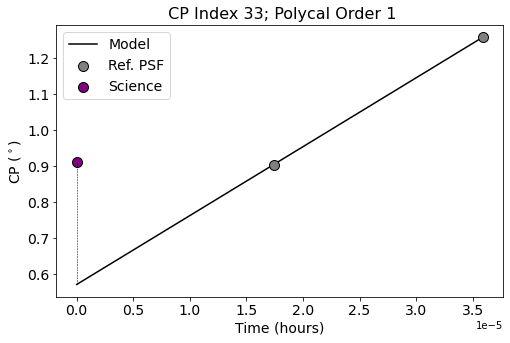

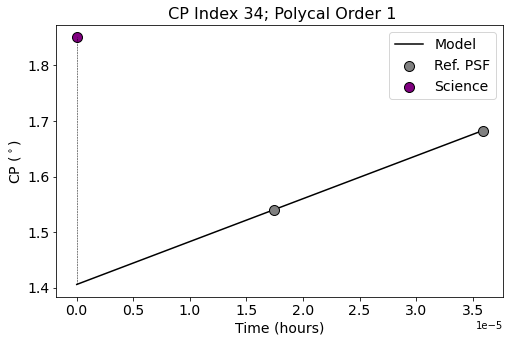

best polynomial calibration is of order 0


In [56]:
###get organized first
tcps = np.array([cps_sc[1]])
tcvar = np.array([cps_sc[3]])
tt = np.array([ut_m_sc])

c1cps = np.array([cps_r1[1]])
c1cvar = np.array([cps_r1[3]])
ct1 = np.array([ut_m_r1])

c2cps = np.array([cps_r2[1]])
c2cvar = np.array([cps_r2[3]])
ct2 = np.array([ut_m_r2])

ccps = np.array(list(c1cps)+list(c2cps))
ccvar = np.array(list(c1cvar)+list(c2cvar))
ctin = np.array(list(ct1)+list(ct2))

###use display=True to generate some plots along the way
res = [poly_ps(tcps,ccps,tt,ctin,corder,'cps',display=True)
          for corder in range(2)]

std_cps_cal = [np.std(res[x][0]) for x in range(len(res))]
best = np.where(std_cps_cal==np.min(std_cps_cal))[0][0]
print('best polynomial calibration is of order '+str(best))

cps_best = res[best]
cps_tofit = cps_best[0].T

### plot those up (you'll notice they are basically the same as the simple calibration)

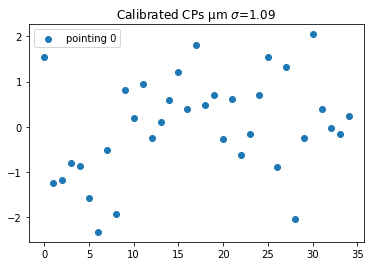

In [57]:
for i in range(len(cps_tofit)):
    plt.scatter(range(35),cps_tofit[i],label='pointing '+str(i))
plt.title('Calibrated CPs µm $\sigma$='+str(np.round(np.std(cps_tofit),2)))
plt.legend()
plt.show()

### same deal for squared visibility polycal example

cords = 0


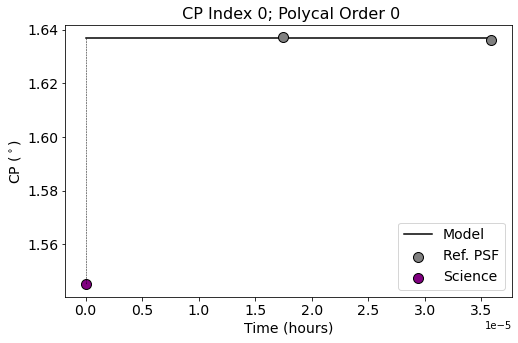

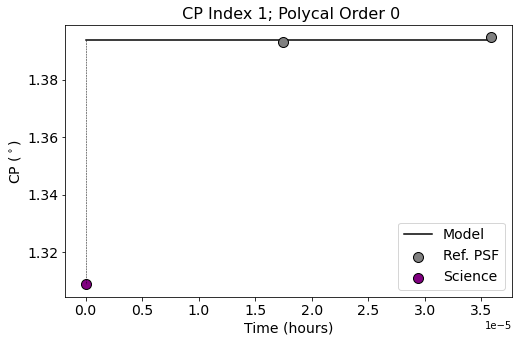

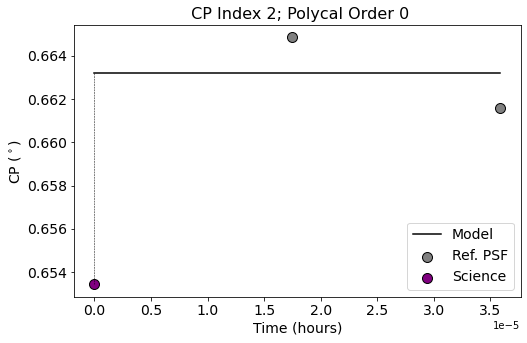

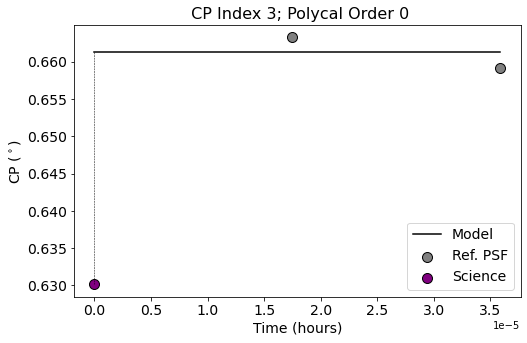

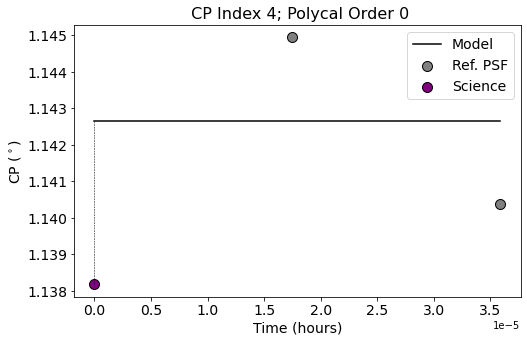

...

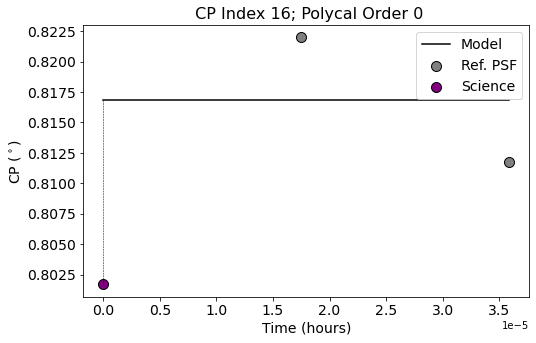

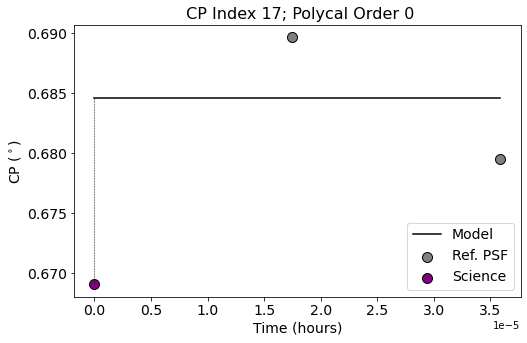

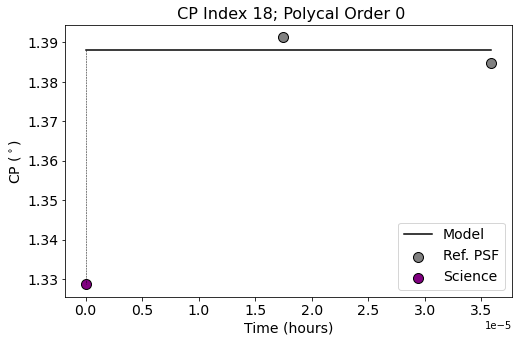

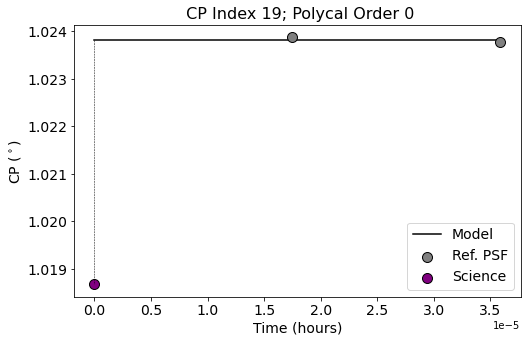

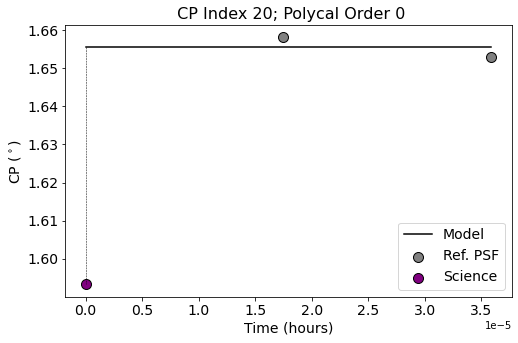

cords = 1


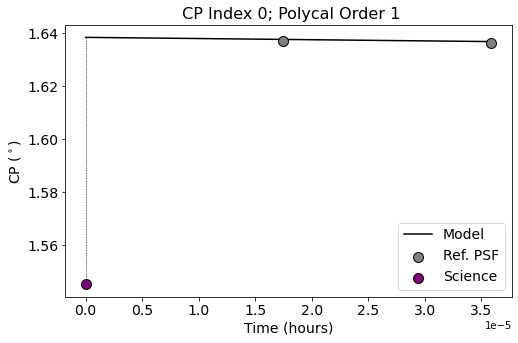

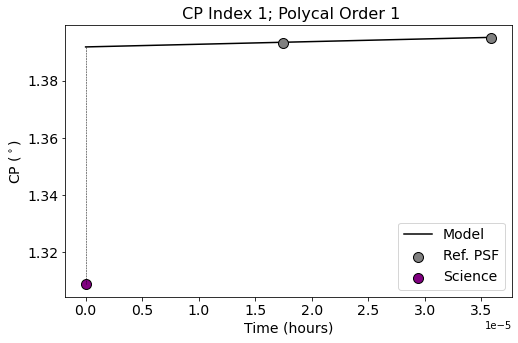

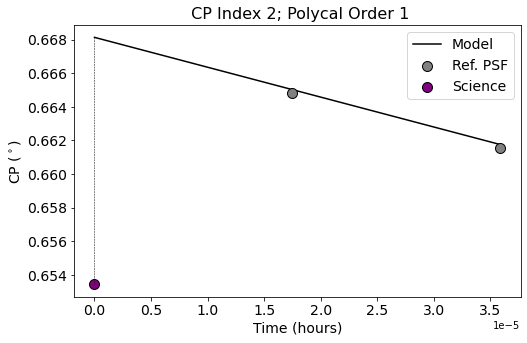

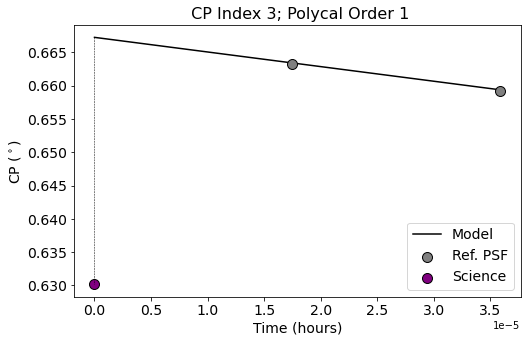

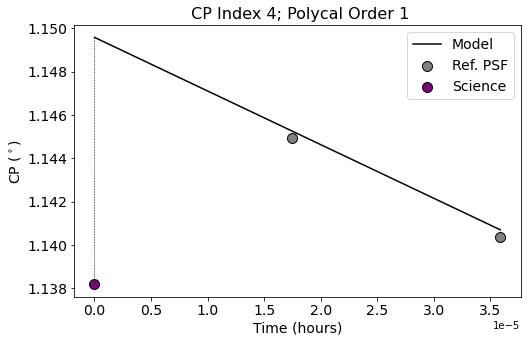

...

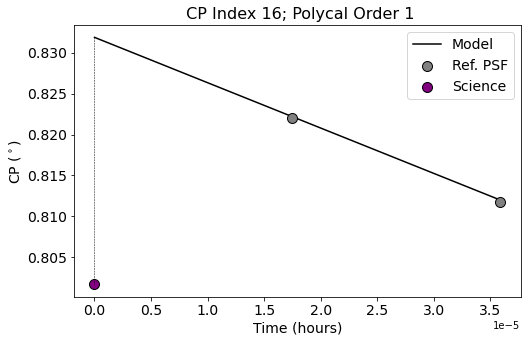

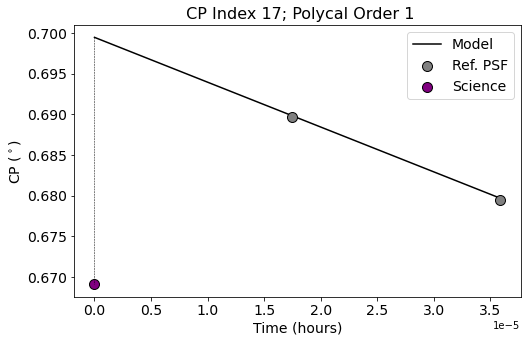

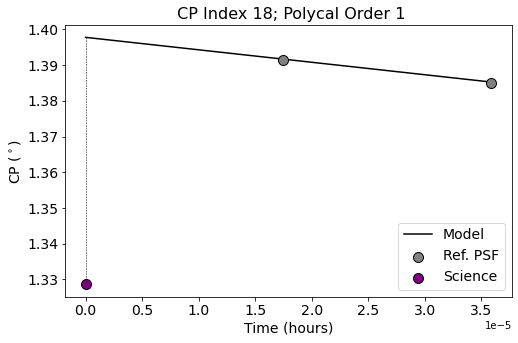

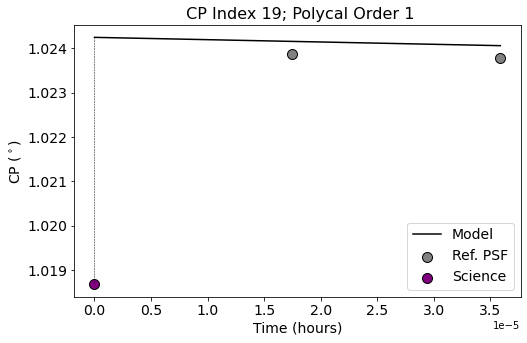

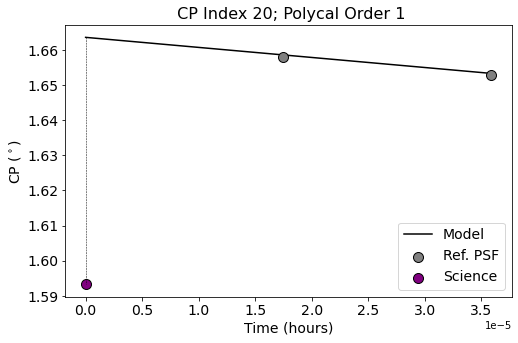

best polynomial calibration is of order 0


In [58]:
###get organized first
tv2s = np.array([v2s_sc[0]])
tvvar = np.array([v2s_sc[2]])
tt = np.array([ut_m_sc])

c1v2s = np.array([v2s_r1[0]])
c1vvar = np.array([v2s_r1[2]])
ct1 = np.array([ut_m_r1])

c2v2s = np.array([v2s_r2[0]])
c2vvar = np.array([v2s_r2[2]])
ct2 = np.array([ut_m_r2])

cv2s = np.array(list(c1v2s)+list(c2v2s))
cvvar = np.array(list(c1vvar)+list(c2vvar))
ctin = np.array(list(ct1)+list(ct2))

###use display=True to generate some plots along the way
res = [poly_ps(tv2s,cv2s,tt,ctin,corder,'v2s',display=True)
          for corder in range(2)]

std_v2s_cal = [np.std(res[x][0]) for x in range(len(res))]
best = np.where(std_v2s_cal==np.min(std_v2s_cal))[0][0]
print('best polynomial calibration is of order '+str(best))
v2s_best = res[best]
v2s_tofit = v2s_best[0].T

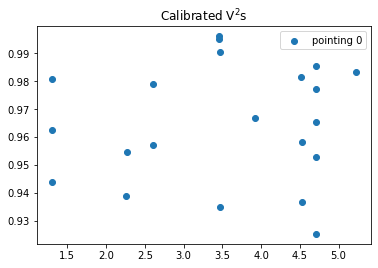

In [59]:
blens = make_blens(cdir)
for i in range(len(v2s_tofit)):
    plt.scatter(blens,v2s_tofit[i],label='pointing '+str(i))
plt.title('Calibrated V$^2$s')# $\sigma$='+str(np.round(np.std(v2s_tofit),2)))
plt.legend()
plt.show()

# generate oifits file

### adopt scatter in calibrated calibrators as noise

In [60]:
targ = 'AB-Dor'
lam = 4.8
cps = np.array(cps_tofit)
cerrs = np.array(np.ones(cps_tofit.shape)*np.std(cal_r1_r2))
v2s = np.array(v2s_tofit)
verrs = np.array(np.ones(v2s_tofit.shape)*np.std(cal_v2s_r1_r2))
fn = targ+'_polycal.oifits'
PAs = np.array([roll_m_sc])
build_oi(targ,lam,cdir,fn,cps=cps,cerrs=cerrs,v2s=v2s,verrs=verrs,PAs=PAs)

# do companion fitting

### ingest uv coverage for closing triangles and baselines

In [61]:
lam=4.8
ps = 0.065
cpuvs = pyfits.getdata(cdir+'cp_uvs.fits')
v2uvs = pyfits.getdata(cdir+'bl_uvs.fits')

### do an MCMC fit

In [62]:
###use suffix to control file naming, set inc_v2s=True to include both cps and v2s, update files every writeint steps
n_iterations=1000
plist,lnplist,lnllist=run_PT_emcee(v2s,verrs,v2uvs,cps,cerrs,cpuvs,
                                   PAs,lam,inc_v2s=True,verbose=False,
                                   overwrite=False,NITS=n_iterations,writeint=200,
                                   suff='ABDor_polycal_f480m_sg')

about to sample
runnning steps 1000 to 1000


IntProgress(value=1000, max=1000, min=1000)

### plot the results!

-6071.967840528312 1.8189894035458565e-12
(1000, 10, 100, 3)
(90000, 3)


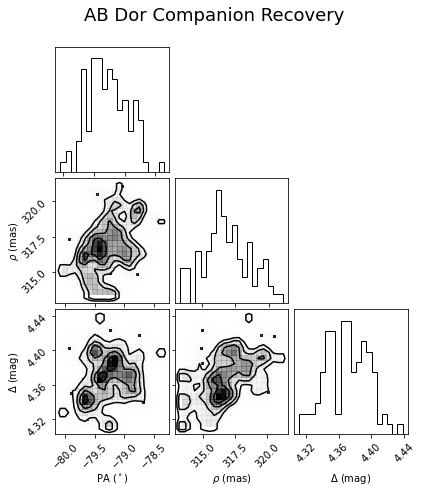

47.109552893322984
[-79.25415579 317.25209617   4.37769989]
(-79.29729293422244, 0.40141377879233175, 0.3056025347989504)
(316.7641605389899, 1.8848266465726624, 1.6833837083196386)
(4.369054419567117, 0.027248904720416967, 0.023992852145956256)


In [63]:
plist2 = np.array(copy.deepcopy(plist))
pnames= [r'PA ($^\circ$)',r'$\rho$ (mas)',r'$\Delta$ (mag)']
plist2[:,:,:,1]*=1000.0
mpars,cpars = plot_corner(np.array(plist2),np.array(lnllist),burnin=100,
                          pnames=pnames,title='AB Dor Companion Recovery',
                         fname = 'corner_demo_ABDor.pdf',smooth=True,figsize=(6,7))

### make a correlation plot

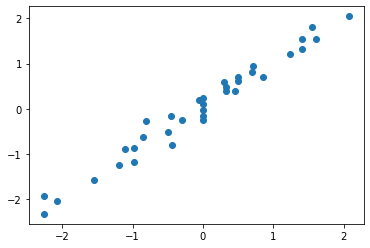

In [64]:
mpars2 = copy.deepcopy(mpars)
mpars2[1]/=1000.0
b_emcee = binary_phase(lam,cpuvs,v2uvs,mpars2,PAs[0],inc_v2s=False)
plt.scatter(b_emcee,cps)
plt.show()

### do a grid fit as well

In [65]:
grid,coords = gen_chi2_grid(cps,cerrs,cpuvs,v2s,verrs,v2uvs,
                            PAs,lam,inc_v2s=True,npas=36,nseps=51,ndms=26)

IntProgress(value=0, max=47736)

### process the grid to make a chi^2 map

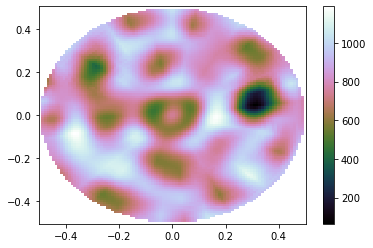

In [66]:
bmod,c2min=proc_binary_grid(grid,coords,cps,v2s)

### make another correlation plot

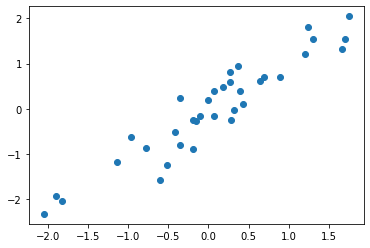

In [67]:
b_ccurve = binary_mod(lam,cpuvs,v2uvs,bmod,PAs[0],inc_v2s=False)
plt.scatter(b_ccurve,cps)
plt.show()